# Importing Libraries

In [101]:
from Neural_Network import Neural_Network
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import kagglehub
from kagglehub import KaggleDatasetAdapter

# Data Exploration

In [102]:
# Set the path to the file you'd like to load
file_path = "breast-cancer.csv"

# Load the latest version
df = kagglehub.load_dataset(
    KaggleDatasetAdapter.PANDAS,
    "yasserh/breast-cancer-dataset",
    file_path,
)

df.head()

C:\Users\Admin\AppData\Local\Temp\ipykernel_12752\2659351917.py:5: DeprecationWarning:

load_dataset is deprecated and will be removed in future version.



,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [103]:
px.histogram(data_frame = df, x = 'diagnosis', color = 'diagnosis', color_discrete_sequence = ['#A865C9', '#F6ABB6'])

# Data Preprocessing

In [104]:
# drop redundant columns
df.drop('id', axis = 1, inplace = True)

In [105]:
df.columns

Index(['diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst'],
      dtype='object')

In [106]:
df['diagnosis'] = (df['diagnosis'] == 'M').astype(int)

In [107]:
df.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


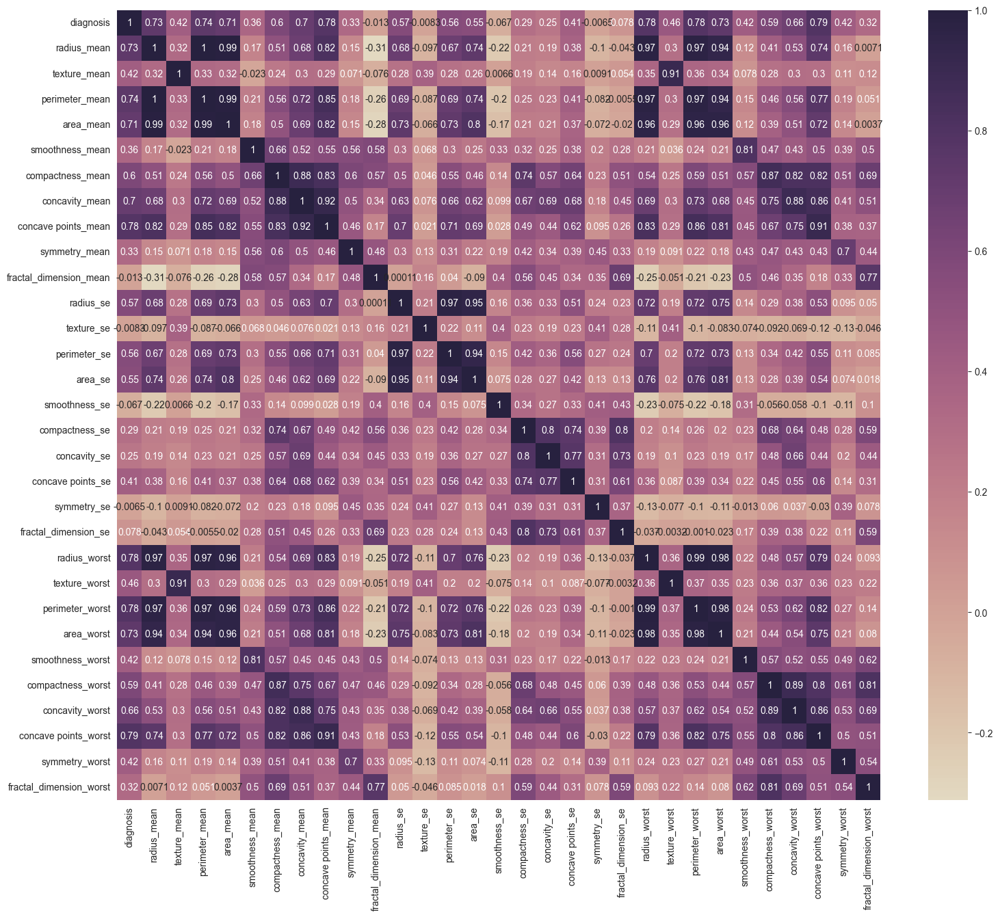

In [108]:
corr = df.corr()
plt.figure(figsize = (18, 15))
sns.heatmap(corr, cmap = sns.color_palette("ch:s=-.2,r=.6", as_cmap = True), annot = True)
plt.show()

# Get the absolute values of the correlation coefficients
cor_target = abs(corr["diagnosis"])

# Select highly correlated features (correlation > 0.2)
relevant_features = cor_target[cor_target > 0.2]

# Collect the names of features
names = [index for index, value in relevant_features.items()]

# Drop the target variable from the result
names.remove("diagnosis")

In [109]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
diagnosis,569.0,0.372583,0.483918,0.000000,0.000000,0.000000,1.000000,1.00000
radius_mean,569.0,14.127292,3.524049,6.981000,11.700000,13.370000,15.780000,28.11000
texture_mean,569.0,19.289649,4.301036,9.710000,16.170000,18.840000,21.800000,39.28000
perimeter_mean,569.0,91.969033,24.298981,43.790000,75.170000,86.240000,104.100000,188.50000
area_mean,569.0,654.889104,351.914129,143.500000,420.300000,551.100000,782.700000,2501.00000
smoothness_mean,569.0,0.096360,0.014064,0.052630,0.086370,0.095870,0.105300,0.16340
compactness_mean,569.0,0.104341,0.052813,0.019380,0.064920,0.092630,0.130400,0.34540
concavity_mean,569.0,0.088799,0.079720,0.000000,0.029560,0.061540,0.130700,0.42680
concave points_mean,569.0,0.048919,0.038803,0.000000,0.020310,0.033500,0.074000,0.20120
symmetry_mean,569.0,0.181162,0.027414,0.106000,0.161900,0.179200,0.195700,0.30400


In [110]:
X = df[names].values
y = df["diagnosis"].values

## Split train and test


In [111]:
def train_test_split(X, y, random_state = 42, test_size = 0.2):
    """
    Splits the data into training and testing sets.

    Parameters:
        X (numpy.ndarray): Features array of shape (n_samples, n_features)
        y (numpy.ndarray): Labels array of shape (n_samples,)
        random_state (int): Seed for the ramdom number generator. Default is 42.
        test_size (float): Proportion of the dataset to include in the test set. Default is 0.2.

    Returns:
        Tuple[numpy.ndarray]: A tuple containing X_train, X_test, y_train, y_test.
    """
    # Get number of samples
    n_samples = X.shape[0]

    # Set the seed for the random number generator
    np.random.seed(random_state)

    # shuffle the indices
    shuffle_indices = np.random.permutation(np.arange(n_samples))

    # Determine the size of the test and train
    test_size = int(n_samples * test_size)

    # Split the indices into test and train
    test_indices = shuffle_indices[:test_size]
    train_indices = shuffle_indices[test_size:]

    # Split the features and target arrays into test and train
    X_train, X_test = X[train_indices], X[test_indices]
    y_train, y_test = y[train_indices], y[test_indices]

    return X_train, X_test, y_train, y_test

In [112]:
def scale(X):
    """
    Standardizes the data in the array X

    Parameters:
        X (numpy.ndarray): Features array of shape (n_samples, n_features)

    Returns:
        numpy.ndarray: The standardized features array
    """

    # Calculate the mean and standard deviation of each feature
    mean = np.mean(X, axis = 0)
    std = np.std(X, axis = 0)

    # Standardize the data
    X = (X - mean) / std
    return X

In [113]:
X = scale(X)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

In [114]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((456, 25), (113, 25), (456,), (113,))

# Model Implementation Helper Functions

## Activation Functions


**The Rectified Linear Unit (ReLU) is a simple, yet highly effective activation function commonly used in Neural Networks. It is defined as:**

**\begin{equation}
f(Z) = max(0, Z)
\end{equation}**

**where $Z$ is the input to the function.**

**ReLU sets all negative values of $Z$ to zero, and leaves the positive values unchanged. This non-linear activation function helps Neural Networks model complex non-linear relationships between inputs and outputs, allowing them to learn more complex representations of the data.**

**In addition to its effectiveness in Neural Networks, ReLU is also computationally efficient and easy to implement.**

## The derivative of the ReLU function can be computed as:

**\begin{equation}
f'(Z) = \begin{cases}
0, & \text{if } Z \leq 0 \
1, & \text{if } Z > 0
\end{cases}
\end{equation}**

### Sigmoid

**The Sigmoid function is a common activation function used in Neural Networks, particularly for binary classification problems. It is represented by the following formula:**

**\begin{equation}
f(Z) = \frac{1}{1+e^{-Z}}
\end{equation}**

**where $Z$ is the input to the function.**

**The Sigmoid function maps any real-valued number to a value between 0 and 1, which can be interpreted as a probability. In binary classification problems, we often use the Sigmoid function as the activation function for the output layer of the Neural Network, since it can be used to compute the probability of the input belonging to the positive class.**


## The derivative of the Sigmoid function can be computed as:

\begin{equation}
f'(Z) = f(Z)(1-f(Z))
\end{equation}


# Model Implementation

# How the Algorithm works

**Initialize Parameters: We start by initializing the weights and biases of the model. For each layer $l$ in the network, we initialize $W^{[l]}$ to be a matrix with dimensions $(n^{[l]}, n^{[l-1]})$, where $n^{[l]}$ is the number of units in layer $l$ and $n^{[l-1]}$ is the number of units in the previous layer. We also initialize $b^{[l]}$ to be a vector with dimensions $(n^{[l]}, 1)$.**

**Forward Propagation: In the forward pass, we propagate through the network calculating the output of every layer. For each layer $l$ in the network, we calculate:**

**\begin{equation}
Z^{[l]} = W^{[l]}.A^{[l-1]} +b^{[l]}
\end{equation}**

**\begin{equation}
A^{[l]} = g(Z^{[l]})
\end{equation}**

**where $A^{[0]} = X$ is the input to the network and $g(.)$ is the activation function used in layer $l$**.

**Compute Cost: We calculate the cost function to determine how well we are doing. For binary classification problems, we often use the binary cross-entropy to measure our network performance. The cost function can be computed as:**

**\begin{equation}
J = -\frac{1}{m} \sum_{i=1}^{m} \left[y^{(i)} \log\left(a^{L}\right) + (1-y^{(i)})\log\left(1- a^{L}\right)\right]
\end{equation}**

**where $a^{L}$ is the predicted output of the network for the $i$-th input example and $y^{(i)}$ is the true output for the $i$-th input example.**

**Backpropagation: In the backward pass, we compute the derivatives of the loss function with respect to the parameters of the network using the chain rule of differentiation. Specifically, we calculate the derivatives of the cost function with respect to $Z^{[l]}$, which can then be used to calculate the derivatives of the cost function with respect to $W^{[l]}$ and $b^{[l]}$.**

**Updating Parameters: We update the parameters of the network using gradient descent, which tries to reduce the cost by adjusting the parameters in the opposite direction of the gradient. The gradient descent rule is, for each layer $l$ in the network:**

**\begin{equation}
W^{[l]} = W^{[l]} - \alpha \text{ } dW^{[l]}
\end{equation}**

**\begin{equation}
b^{[l]} = b^{[l]} - \alpha \text{ } db^{[l]}
\end{equation}**

**where $\alpha$ is the learning rate and $dW^{[l]}$ and $db^{[l]}$ are the derivatives of the cost function with respect to $W^{[l]}$ and $b^{[l]}$, respectively.**


# Evaluation

## Create evaluation function

In [115]:
def train_evaluate_model(X_train, y_train, X_test, y_test, learning_rate, layer_dimensions, epochs):
    '''
    Keyword arguments:
    X_train -- Training data
    y_train -- Training labels
    X_test -- Test data
    y_test -- Test labels
    layer_dimensions -- Python array (list) containing the dimensions of each layer in our network
    learning_rate -- Learning rate of the network
    epochs -- Number of iterations of the optimization loop
    Returns a dataframe
    '''
    # Create model instance with the given hyperparameters
    model = Neural_Network(layer_dimensions, learning_rate)
    # Fit the model
    model.fit(X_train, y_train, epochs = epochs, print_cost = False)
    accuracy, predictions = model.predict(X_test, y_test)  # Calculate accuracy and predictions

    # Create a dataframe to visualize the results
    eval_df = pd.DataFrame([[learning_rate, layer_dimensions, epochs, accuracy]],
                           columns = ['Learning_Rate', 'Layers', 'Epochs', 'Accuracy'])
    return eval_df

In [116]:
learning_rate = 0.001
layers = [25, 1, 1]
epochs = 3000
results = train_evaluate_model(X_train, y_train, X_test, y_test, learning_rate = learning_rate,
                               layer_dimensions = layers, epochs = epochs)

In [117]:
results.index = ['Model_1']

In [118]:
results.style.background_gradient(cmap = sns.cubehelix_palette(start = .5, rot = -.5, as_cmap = True))

,Learning_Rate,Layers,Epochs,Accuracy
Model_1,0.001000,"[25, 1, 1]",3000,0.628319


In [127]:
learning_rate = 0.001
layers = [25, 16, 1]
epochs = 3000
temp_tf = train_evaluate_model(X_train, y_train, X_test, y_test, learning_rate = learning_rate,
                               layer_dimensions = layers, epochs = epochs)
temp_tf.index = ['Model_2']
results = pd.concat([results, temp_tf])
results

,Learning_Rate,Layers,Epochs,Accuracy
Model_1,0.001,"[25, 1, 1]",3000,0.628319
Model_2,0.001,"[25, 16, 1]",3000,0.672566


## View training process for the best results "Model 5 with lowest runtime and highest accuracy"

In [129]:
model = Neural_Network(learning_rate = 0.0001)

model.fit(X_train, y_train, epochs = 30000, print_cost = True)

Cost after iteration 0: 0.6931646385744642
Cost after iteration 5000: 0.6859908438587179
Cost after iteration 10000: 0.6804080309241175
Cost after iteration 15000: 0.6760589221252522
Cost after iteration 20000: 0.6726670677037513
Cost after iteration 25000: 0.6700190881972162


In [130]:
accuracy, predictions = model.predict(X_test, y_test)